# Tone Encoder
### A Metadata-Informed Autoencoder for Raw Waveforms

*by Henry Ives, May 12, 2020*

## Introduction

I am interested in how deep neural networks learn, and in exploring interesting uses of autoencoders. In order to do this, I have created a convolutional autoencoder for audio signals that is informed by metadata after encoding. I've done this with the hopes of later creating interesting sounds by confusing the network with incorrect metadata.

## Methods

This project is largely inspired by the work done at DeepMind on the WaveNet and the NSynth [Engel, et al., 2017][van den Oord et al., 2016]. In a way, this is a reduction of such models to something more practical for consumer-grade resources. The project is implemented end-to-end using TensorFlow and Keras [Chollet, 2015].

Speaking of resources, a key aspect of the development of my project was the ability to train on TPU's via [Google Colab](https://colab.research.google.com/). The code here is written to run either locally or in Google Colab on the TPU's, using the `IN_COLAB` flag to handle environment-dependent behavior.

*If you choose to run the code yourself, begin by executing the three cells in the Appendix section at the end of the notebook. I also recommend training within Colab unless your local system is extremely powerful.*

### Data Import and Pre-Processing

The state-of-the-art dataset for individual musical notes is the [NSynth Dataset](https://magenta.tensorflow.org/datasets/nsynth#files). It contains over 300,000 4-second samples of a variety of instruments from commercial sample libraries, as well as associated metadata describing pitch, velocity, instrument, and a variety of qualities. The audio is sampled at 16000 Hz, resulting in 64000 floating-point features between -1 and 1 per example. The whole dataset is over 70 GB. Fortunately, the dataset is available via the Tensorflow Dataset API, allowing relatively simple download and pre-processing. When in Colab, the dataset can be accessed via Google Cloud Storage, allowing it to be streamed directly to the TPU's.

*Due to the size of the dataset and the method by which I used it, I had no reasonable way to include it in my submission.
If you choose to download it to run the rest of this notebook (possibly an overnight download), set `download` to `True`.
Otherwise, I recommend either running the notebook in Colab (in which case the dataset will be streamed from GCS automatically)
or just looking at the output*

In [26]:
nsynth_ds, test_ds, nsynth_info, train_split = te.obtain_datasets(download=False, data_dir='./Overflow', download_dir='./Overflow/downloads')
print(nsynth_info.description)
print('nsynth_ds:\n', nsynth_ds)
print()
print('test_ds:\n', test_ds)
print()
print('Training split: ', train_split)

The NSynth Dataset is an audio dataset containing ~300k musical notes, each
with a unique pitch, timbre, and envelope. Each note is annotated with three
additional pieces of information based on a combination of human evaluation
and heuristic algorithms:
 -Source: The method of sound production for the note's instrument.
 -Family: The high-level family of which the note's instrument is a member.
 -Qualities: Sonic qualities of the note.

The dataset is split into train, valid, and test sets, with no instruments
overlapping between the train set and the valid/test sets.

nsynth_ds:
 <_OptionsDataset shapes: {audio: (64000,), id: (), instrument: {family: (), label: (), source: ()}, pitch: (), qualities: {bright: (), dark: (), distortion: (), fast_decay: (), long_release: (), multiphonic: (), nonlinear_env: (), percussive: (), reverb: (), tempo-synced: ()}, velocity: ()}, types: {audio: tf.float32, id: tf.string, instrument: {family: tf.int64, label: tf.int64, source: tf.int64}, pitch: tf

{'audio': array([ 2.3034564e-03,  1.4877228e-02,  3.5087761e-02, ...,
       -6.5495326e-05,  1.0688615e-04, -2.4151095e-04], dtype=float32), 'id': b'guitar_electronic_022-060-100', 'instrument': {'family': 3, 'label': 367, 'source': 1}, 'pitch': 60, 'qualities': {'bright': False, 'dark': True, 'distortion': False, 'fast_decay': False, 'long_release': False, 'multiphonic': False, 'nonlinear_env': False, 'percussive': False, 'reverb': False, 'tempo-synced': False}, 'velocity': 100}


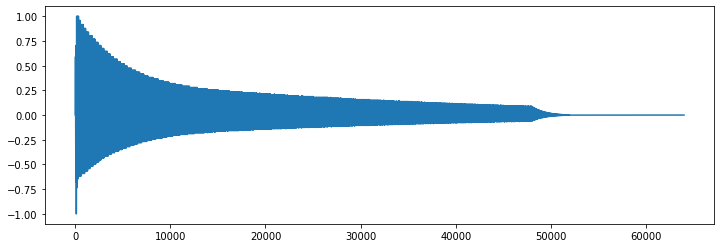

{'audio': array([ 1.1405039e-06, -2.1437959e-06,  3.7508810e-06, ...,
        3.4030276e-07,  6.0403871e-10, -4.7028274e-07], dtype=float32), 'id': b'keyboard_electronic_098-034-100', 'instrument': {'family': 4, 'label': 524, 'source': 1}, 'pitch': 34, 'qualities': {'bright': False, 'dark': True, 'distortion': True, 'fast_decay': False, 'long_release': False, 'multiphonic': False, 'nonlinear_env': False, 'percussive': False, 'reverb': False, 'tempo-synced': False}, 'velocity': 100}


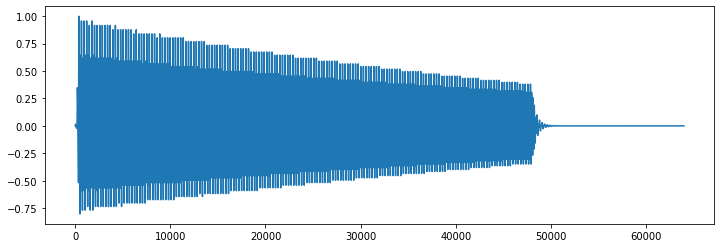

In [78]:
# Inspect dataset

_ = te.ds_peek(nsynth_ds, 3, show=True, encode=True, decode=True)
_ = te.ds_peek(test_ds, 5, show=True, encode=True, decode=True)

TensorFlow exposes the tf.data API for efficient data ingestion. My downloaded data is in the Tensorflow Dataset format, allowing me to preprocess it using simple methods for efficient training. I wrote `train_fn` to translate the data from its dictionary format into the tuple format ((audio, metadata), audio). These represent the two inputs and single output of my model, respectively. This function also reformats the audio, slicing anything before the maximum value to align the starting point at the transient, reducing the total size of the sample from 64000 to 32000 for consistency and further practicality, aand performing [mu-law encoding](https://en.wikipedia.org/wiki/%CE%9C-law_algorithm) for further accuracy [Babuschkin, 2018]. The metadata is also translated from a dictionary format to a float32 tensor of shape (32, 8) in order to match the input dimensions.

In [38]:
# Data preprocessing

train_ds = (nsynth_ds
            .map(te.train_fn, num_parallel_calls=tf.data.experimental.AUTOTUNE)
            .cache()
            .shuffle(nsynth_info.splits[train_split].num_examples)
            .batch(64, drop_remainder=True)
            .prefetch(tf.data.experimental.AUTOTUNE))

eval_ds = (test_ds
           .map(te.train_fn, num_parallel_calls=tf.data.experimental.AUTOTUNE)
           .cache()
           .shuffle(nsynth_info.splits['test'].num_examples)
           .batch(64, drop_remainder=True)
           .prefetch(tf.data.experimental.AUTOTUNE))

In [39]:
print(train_ds)
print(eval_ds)

<PrefetchDataset shapes: (((64, 32000, 1), (64, 32, 8)), (64, 32000, 1)), types: ((tf.float32, tf.float32), tf.float32)>
<PrefetchDataset shapes: (((64, 32000, 1), (64, 32, 8)), (64, 32000, 1)), types: ((tf.float32, tf.float32), tf.float32)>


### Model Construction

The model is a convolutional autoencoder. The encoding portion comprises three convolutional layers with a kernel size of 122 and a stride size of 8. After the second layer there is a max pooling layer. The first two convolutional layers have 44 units each, while the last has 8. This results in an encoding of shape (32, 8). This encoding is then concatenated along its first axis (axis 1 in the context of the model, where batch size is axis 0) with the metadata, which is in the same shape, resulting in an output with shape (64, 8). The decoder portion includes four more convolutional layers, also with kernel size 122 but with a stride size of 1. The first three layers have 44 units each, and have upsampling layers between them to increase dimensionality. The final convolution layer outputs the same shape as the input, (32000, 1).

The model encodes 32,000 floating point values representing the input waveform to a latent space with of a total of 512 values, resulting in a 98.4% compression of the data. My goal was that the metadata would assist in the decoding process, at least helping inform frequency, if not some qualitative or harmonic aspects.

I used Leaky ReLU due to the model's depth, Adam with a learning rate of 1e-4, and Mean Squared Error for the loss function.

This architecture is the result of a compromise between a model that can reasonably fit and be trained with limited resources, and a model that can produce meaningful output given the number of features per sample.

*I will include the latest versions of my model's saved weights, which can be loaded by setting save_dir to their location on your machine and using the 'checkpoint' method.*

In [34]:
# View directory of saved models and checkpoints

if IN_COLAB:
    print('Savepoints:')
    !gsutil ls -l {os.path.join(FILE_PREFIX, 'savepoints')}
    print('Checkpoints:')
    !gsutil ls -l {os.path.join(FILE_PREFIX, 'checkpoints')}
else:
    print('Savepoints:')
    print(os.listdir(os.path.join(FILE_PREFIX, 'savepoints')))
    print('Checkpoints:')
    print(os.listdir(os.path.join(FILE_PREFIX, 'checkpoints')))

Savepoints:
['20200506-000000', '20200506-162413', '20200506-175157', '20200508-204224', '20200510-011925', '20200510-035907', '20200510-044627', '20200510-051528', '20200510-074954', '20200510-122949', '20200510-132016', '20200510-132052', '20200510-214322', '20200511-061648', '20200512-060101.data-00000-of-00002', '20200512-060101.data-00001-of-00002', '20200512-060101.index', '20200512-092622.data-00000-of-00002', '20200512-092622.data-00001-of-00002', '20200512-092622.index', '20200512-104500.data-00000-of-00002', '20200512-104500.data-00001-of-00002', '20200512-104500.index', '20200512-154701', 'checkpoint']
Checkpoints:
['.data-00000-of-00002', '.data-00001-of-00002', '.index', 'checkpoint']


Constructing model...
Model constructed.
Encoder constructed
Compiling model...
Model compiled.
Loading weights from  .\checkpoints\ ...
Weights loaded
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
audio_input (InputLayer)        [(64, 32000, 1)]     0                                            
__________________________________________________________________________________________________
en_conv_0 (Conv1D)              (64, 4000, 44)       5412        audio_input[0][0]                
__________________________________________________________________________________________________
en_conv_1 (Conv1D)              (64, 500, 44)        236236      en_conv_0[0][0]                  
__________________________________________________________________________________________________
en_pool_1 (MaxPooling1D)        (64, 250,

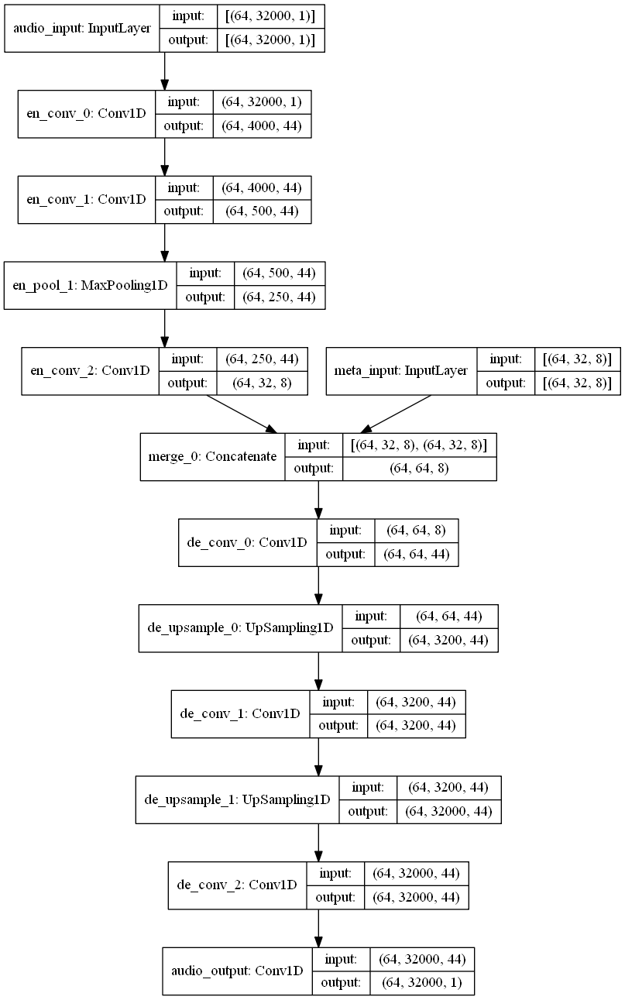

In [24]:
save_dir = os.path.join(FILE_PREFIX, 'savepoints', '20200512-173735', '')  # for loading from saved point
# save_dir= os.path.join(FILE_PREFIX, 'checkpoints', '')  # for loading most recent training checkpoint
if IN_COLAB:
    with strategy.scope():
        model, encoder, plot_img = te.get_ToneEncoder(method='checkpoint', save_dir=save_dir, plot=True)
else:
    model, encoder, plot_img = te.get_ToneEncoder(method='checkpoint', save_dir=save_dir, plot=True)
plot_img

In [35]:
# Evaluate the loaded weights — this should be around 3100

model.evaluate(eval_ds)

     64/Unknown - 38s 598ms/step - loss: 3079.7864

3079.786445617676

### Training

The training process of my model was riddled with logistical impediments. Since the goal of the output was primarily creative, the loss metric is not meaningful beyond functioning as a benchmark for relative progress. For this reason, as well as due to time and resource constraints, I trained the model in bursts of a few epochs using the validation set on my local machine initially, while I was still tweaking hyperparameters. Using the training set locally proved infeasible, taking approximately 3 hours per epoch (even when running on my GPU), so I configured my code to run on the Colab TPU's and did the bulk of my training with the training set there. Even with that processing power, training took roughly 20 minutes per epoch; hindered somewhat by Colab's idle time-out policy.

The latest version has been trained for approximately 70 epochs in short bursts over the course of several days. The training loss has converged at around 2850 and the validation loss has converged at around 3100. Due to the size of the dataset and depth of the model, it is likely that more training could be done without overfitting, though significant improvements in the quality of the output are unlikely.

In [265]:
# Train model

epochs = 1
save_dir = os.path.join(FILE_PREFIX, 'savepoints', '')
check_dir = os.path.join(FILE_PREFIX, 'checkpoints', '')
log_dir = os.path.join(FILE_PREFIX, 'logs', '')

history = te.train_TE(model, train_ds, eval_ds, epochs, save_dir, check_dir, log_dir)

# Append history to list (for multiple separate training runs)
try:
    histories.append((history, datetime.datetime.now().strftime("%Y%m%d-%H%M%S")))
except (NameError, AttributeError):
    histories = []
    histories.append((history, datetime.datetime.now().strftime("%Y%m%d-%H%M%S")))

te.plot_histories(histories)

In [40]:
# Optional TensorBoard viewer for training sessions

if IN_COLAB:
    %load_ext tensorboard
    %tensorboard --logdir {log_dir}

## Results

Below you'll find visualizations of 10 sample input/output pairs that I chose to represent the range of qualitative accuracy of the models. These correspond to .wav files in the wavs directory.

Demoing keyboard_electronic_003-052-050
Family: Keyboard
Pitch: 52


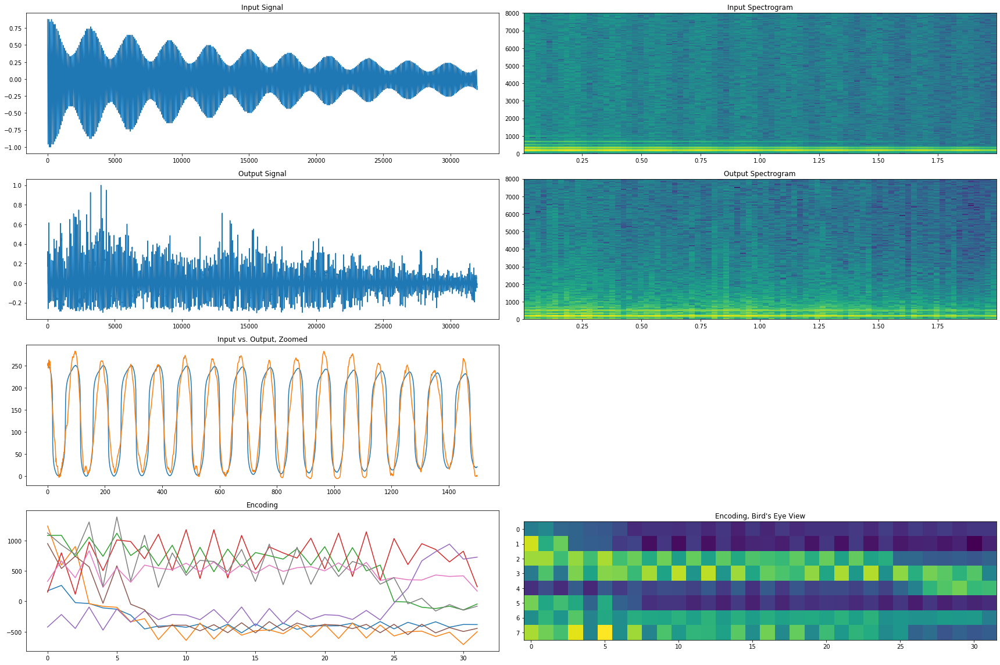

Playing input...
Playing output...
Writing input audio to .\wavs\keyboard_electronic_003-052-050_input.wav ...
Input audio written.
Writing output audio to .\wavs\keyboard_electronic_003-052-050_output.wav ...
Output audio written.

Demoing string_acoustic_014-058-050
Family: String
Pitch: 58


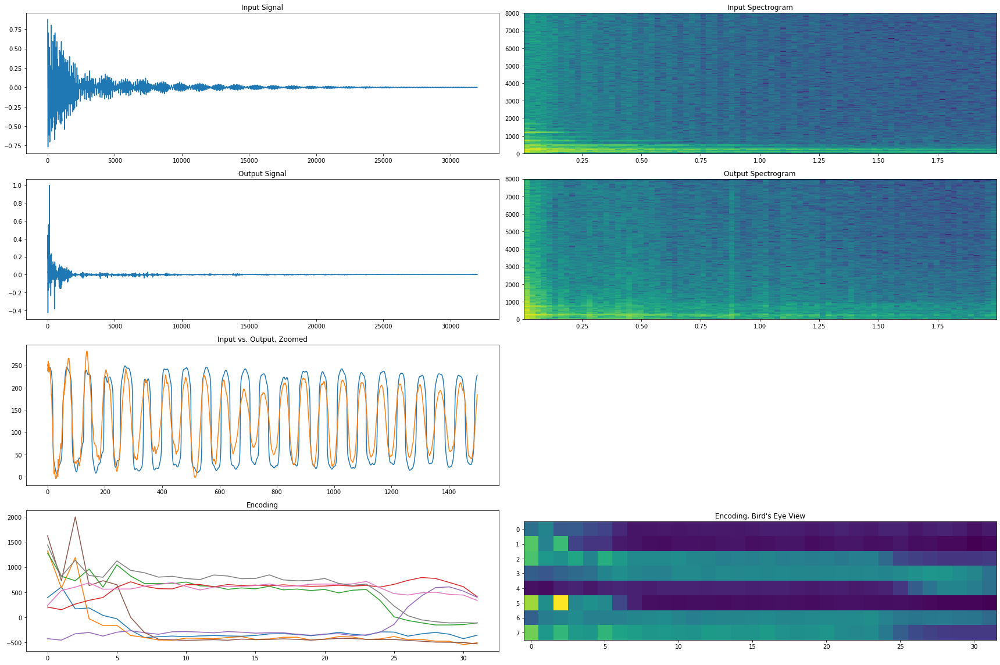

Playing input...
Playing output...
Writing input audio to .\wavs\string_acoustic_014-058-050_input.wav ...
Input audio written.
Writing output audio to .\wavs\string_acoustic_014-058-050_output.wav ...
Output audio written.

Demoing bass_synthetic_068-051-127
Family: Bass
Pitch: 51


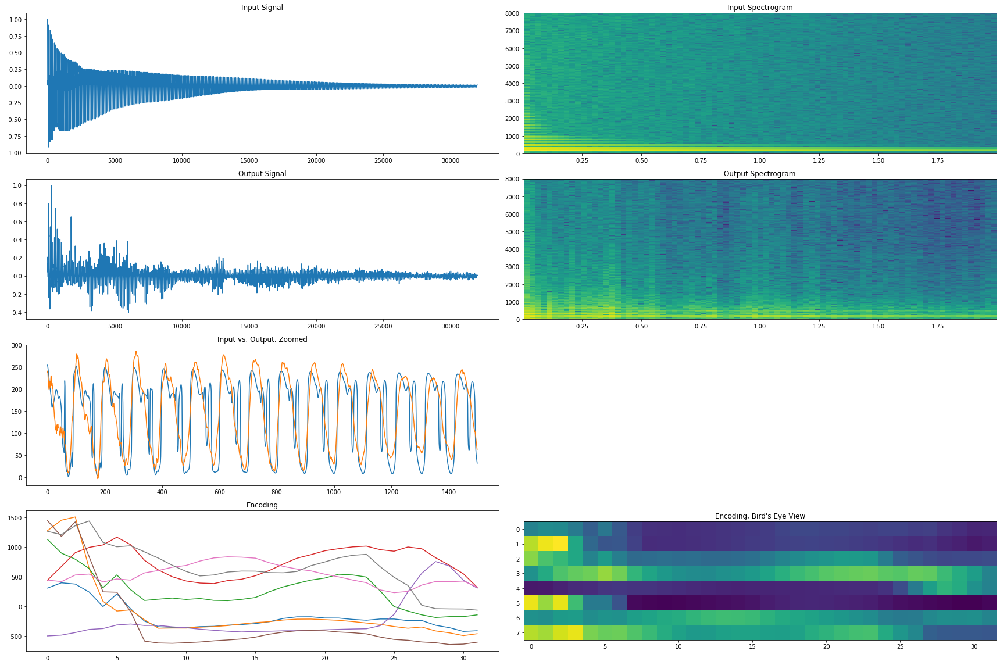

Playing input...
Playing output...
Writing input audio to .\wavs\bass_synthetic_068-051-127_input.wav ...
Input audio written.
Writing output audio to .\wavs\bass_synthetic_068-051-127_output.wav ...
Output audio written.

Demoing organ_electronic_057-038-075
Family: Organ
Pitch: 38


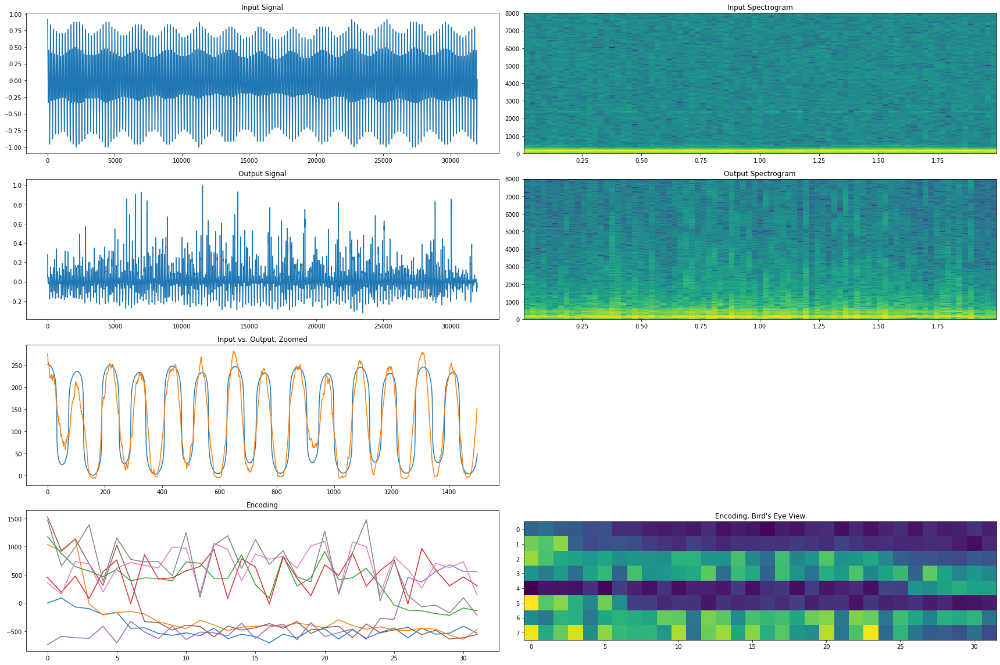

Playing input...
Playing output...
Writing input audio to .\wavs\organ_electronic_057-038-075_input.wav ...
Input audio written.
Writing output audio to .\wavs\organ_electronic_057-038-075_output.wav ...
Output audio written.

Demoing string_acoustic_014-058-050
Family: String
Pitch: 58


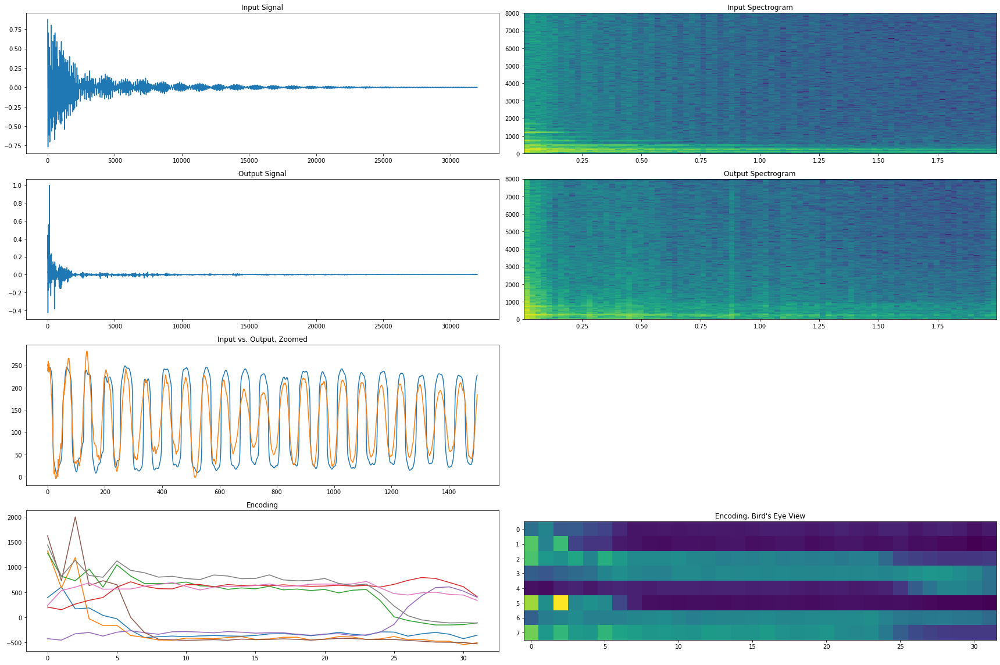

Playing input...
Playing output...
Writing input audio to .\wavs\string_acoustic_014-058-050_input.wav ...
Input audio written.
Writing output audio to .\wavs\string_acoustic_014-058-050_output.wav ...
Output audio written.

Demoing guitar_acoustic_010-051-100
Family: Guitar
Pitch: 51


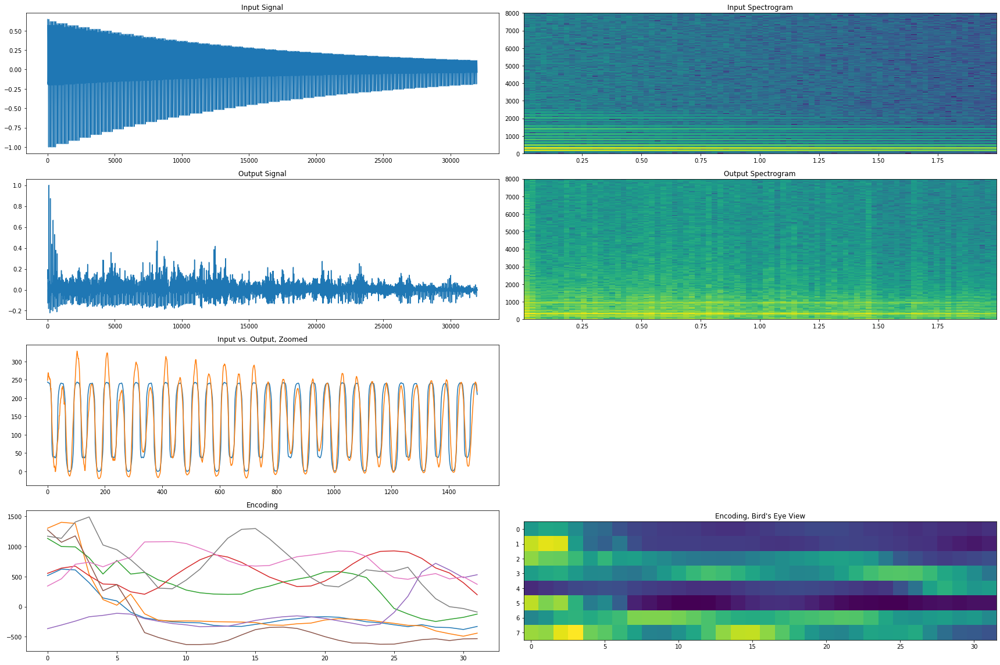

Playing input...
Playing output...
Writing input audio to .\wavs\guitar_acoustic_010-051-100_input.wav ...
Input audio written.
Writing output audio to .\wavs\guitar_acoustic_010-051-100_output.wav ...
Output audio written.

Demoing EDITED_guitar_acoustic_010-051-100_pitchup1200_source2000
Family: Guitar
Pitch: 1251


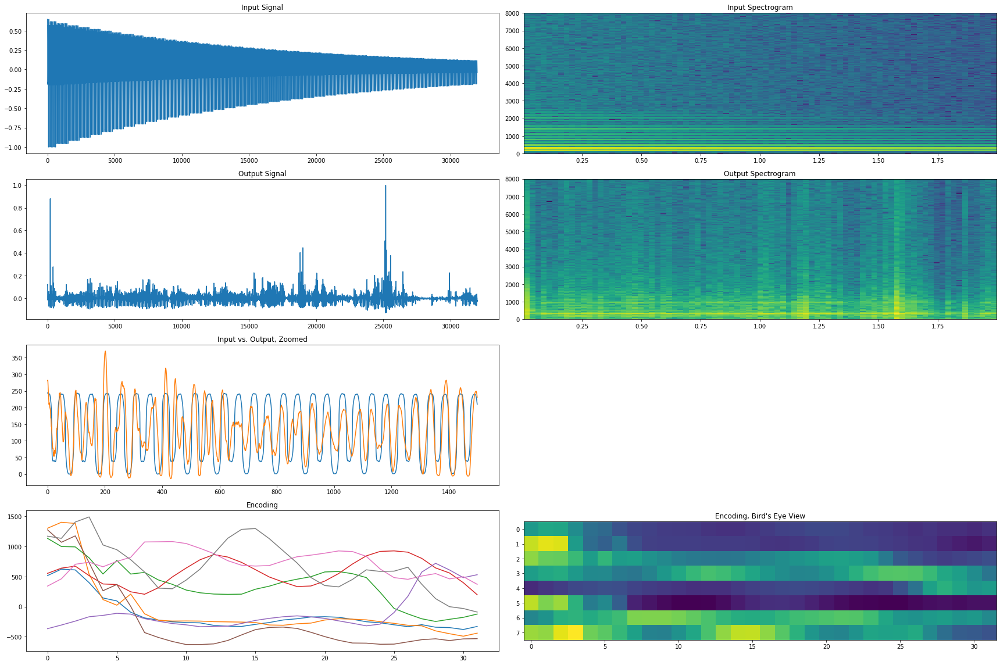

Playing input...
Playing output...
Writing input audio to .\wavs\EDITED_guitar_acoustic_010-051-100_pitchup1200_source2000_input.wav ...
Input audio written.
Writing output audio to .\wavs\EDITED_guitar_acoustic_010-051-100_pitchup1200_source2000_output.wav ...
Output audio written.

Demoing EDITED_bass_synthetic_068-051-127_pitchdn24
Family: Bass
Pitch: 27


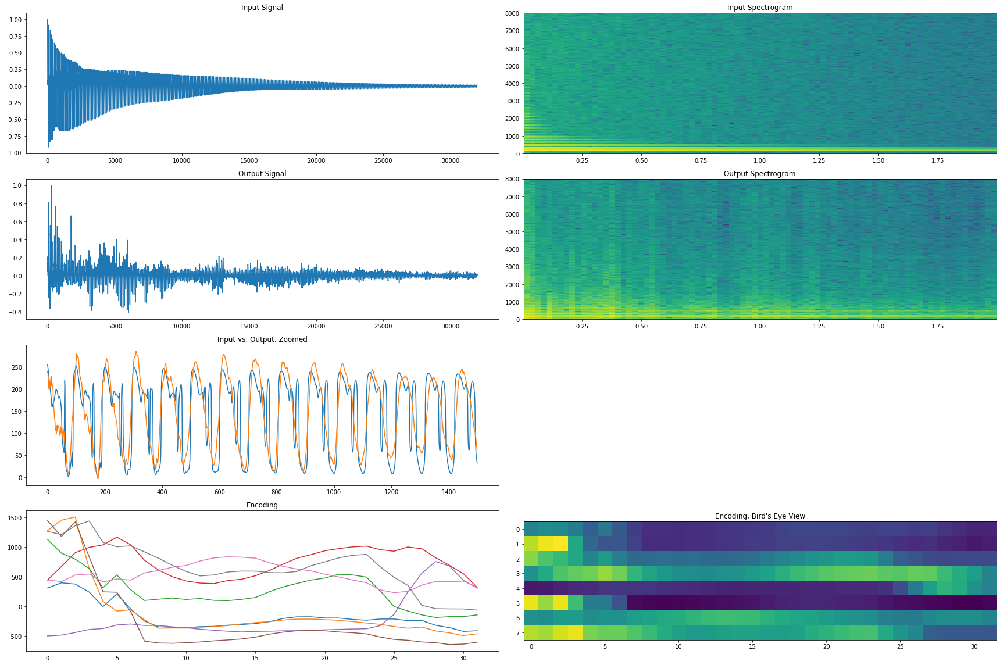

Playing input...
Playing output...
Writing input audio to .\wavs\EDITED_bass_synthetic_068-051-127_pitchdn24_input.wav ...
Input audio written.
Writing output audio to .\wavs\EDITED_bass_synthetic_068-051-127_pitchdn24_output.wav ...
Output audio written.

Demoing keyboard_acoustic_004-033-075
Family: Keyboard
Pitch: 33


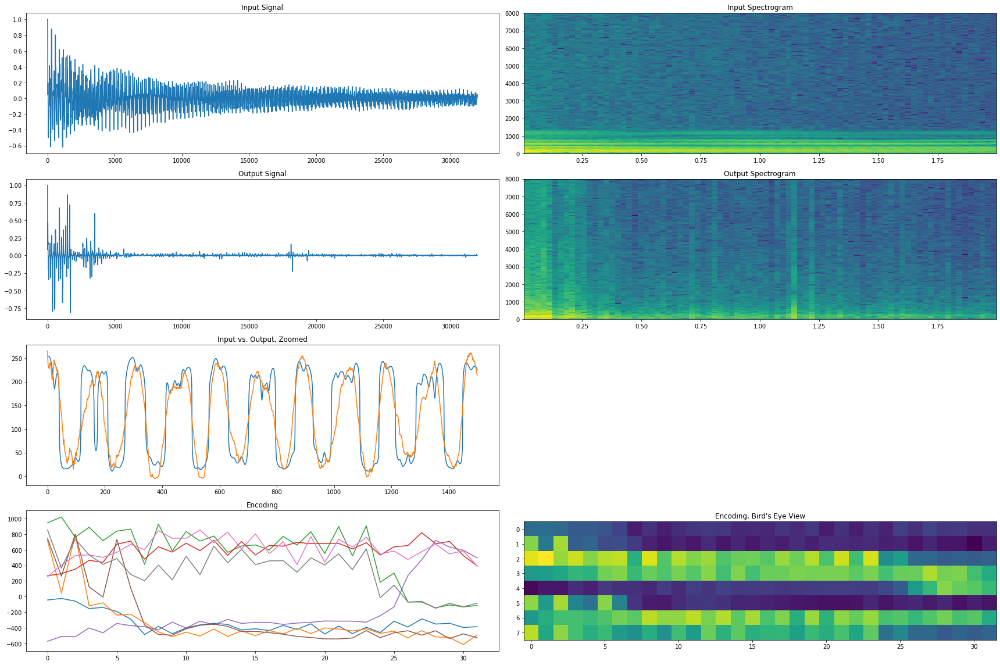

Playing input...
Playing output...
Writing input audio to .\wavs\keyboard_acoustic_004-033-075_input.wav ...
Input audio written.
Writing output audio to .\wavs\keyboard_acoustic_004-033-075_output.wav ...
Output audio written.

Demoing EDITED_keyboard_acoustic_004-033-075_pitchdn2400
Family: Keyboard
Pitch: -2367


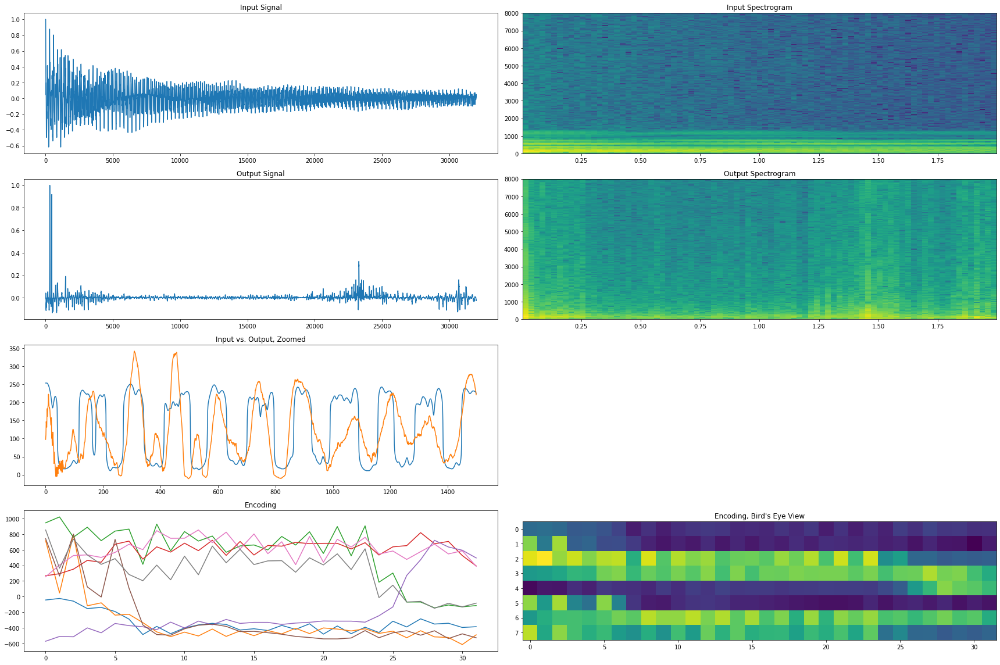

Playing input...
Playing output...
Writing input audio to .\wavs\EDITED_keyboard_acoustic_004-033-075_pitchdn2400_input.wav ...
Input audio written.
Writing output audio to .\wavs\EDITED_keyboard_acoustic_004-033-075_pitchdn2400_output.wav ...
Output audio written.



In [269]:
# Demo and save some interesting example elements
# When running the notebook, use ds_peek to retrieve elements (individual examples) to demo.

wav_dir = os.path.join(FILE_PREFIX, 'wavs', '')
for elem in best_elems:
    _ = te.demo_ToneEncoder(model, encoder, elem, write_wav=True, wav_dir=wav_dir)
    print()

### Output Audio

Somewhat predictably, a model of this size is not able to very faithfully reproduce data samples with so many features. That said, it was able to successfully learn how to emulate basic oscillations and match frequency. As seen in the spectrograms, the model is able to match at least the fundamental frequency of many samples, and sometimes even some of the lower harmonics. As can be seen in the zoomed plots of the raw output, the model isn't able to accurately recreate the more complex waveforms, but still matches the wavelength. Plotting the signals reveals a decent approximation of the macro envelope of the samples as well. That said, on both the macro and the micro scale, the output is very noisy.

These visual observations can also be heard in the included .wav files of these samples. For many of the examples, the sound of the input is discernible through the noise of the output, which is a respectable result given the granularity of the task. Interestingly, in some of the examples, upper harmonics become more present than in the original. This is particularly noticeable in guitar_acoustic_010-051-100, where the output seems to sound an octave above the input.

In general, the model seems to have learned best how to reproduce sounds in the middle of the pitch range, with standard envelopes and not overly complex waveforms.

### Encodings

Examining the encodings reveals some interesting elements of what the model has learned. It seems that the kernel size of 122 has caused the model to encode most transparently information about very low-frequency variations and oscillations. This is to say, the most obvious pattern is that the smoothness of the encoding curves is related to how smooth the input signal is on the scale of roughly 1000–3000 timesteps, which relates to how pitch and harmonics vary over time. Signals with significant regular oscillation on that scale (such as keyboard_electronic_003-052-050) result in oscillating encodings, especially in unit 4. Similarly, signals with highly varied low-frequency harmonics (such as keyboard_acoustic_004-033-075) result in similarly spikey and more varied encoding curves. Signals without such low-frequency oscillation and variation have much smoother encodings, especially around the middle values. Furthermore, the smoother encodings seem to be decoded more successfully than those that vary widely or oscillate.

### Metadata Confusion

My hope for this project was that the model would be able to reproduce audio faithfully enough that noticeable, and even logical, observations could be made when the metadata was edited. Unfortunately, this model and method weren't able to do this successfully. I primarily experimented with changing pitch values up and down one or two octaves to see if it would have any bearing on frequency, but there was no noticeable change. To get a better idea of how the model was using such metadata, I tried using extreme values for pitch, such as -2367 or 1251 (normal pitch values in this format lie between 0 and 127). While these did noticeably degrade the quality of the output, it is clear that the model learned more from the encoding than from the metadata.

## Conclusions

### Feature-Dense Autoencoders

The primary thing I learned from this is how difficult it is to get this level of compression from such dense data. It would likely take a deeper model than could fit on a consumer-grade laptop to get a reasonably faithful reproduction of the original sound. That said, I do think I may have chosen too small an encoding, regardless of model size. Perhaps my goals would have been better accomplished without such an extreme bottleneck.

Another aspect I would be interested in exploring further is different ways of using the metadata. Though I think concatenating it with the encoding is a large improvement from my original plan to simply concatenate it with the input, I wonder what other methods would have worked better. One thing that has become obvious to me is that I didn't do enough to preprocess it—I mostly just left the raw values, including values between 0 and 127 for pitch, and 0s or 1s for the true/false qualities. These values were then concatenated with the encodings, which contained values anywhere from -500 to 1500. Perhaps normalizing the concatenated layer would allow the metadata to better inform training. Alternately, the NSynth architecture uses the encoding of an audio signal to bias layers of a generational model, so perhaps biasing the decoder with the metadata would better allow the metadata to inform the generation of the output in a more meaningful way.

### Other Observations and Discoveries

This was my first time diving into TensorFlow for the whole process, from data download to training. I learned a lot about not only its specific API, but also a bit about how it works "under the hood" including the way it creates graphs and effectively compiles Python code. I'm very interested in diving deeper into how to leverage these tools for efficient data analysis.

Another tool that I became acquainted with over the course of this project was the Google Cloud Platform and Google Colab. In order to save or load weights for a model that's on a TPU, those weights must be in a Google Cloud Storage Bucket, so I got my first taste of that type of data storage.

Finally, this project allowed me to explore just the tip of the iceberg that is signal processing. I had to brush up on my knowledge of Fourier Transforms in order to implement the spectrogram visualizations. As a musician and computer scientist, this subject is at the junction of my interests, and something I would love to further explore.

## References

* [Babuschkin, 2018] Igor Babuschkin. [tensorflow-wavenet](https://github.com/ibab/tensorflow-wavenet). 2018.

* [Chollet, 2015] Francois Chollet and others. "Keras". 2015

* [Engel, et al., 2017] Jesse Engel, Cinjon Resnick, Adam Roberts, Sander Dieleman, Douglas Eck,
  Karen Simonyan, and Mohammad Norouzi. "Neural Audio Synthesis of Musical Notes
  with WaveNet Autoencoders". 2017.
  
* [van den Oord et al., 2016] Aäron van den Oord, Sander Dieleman, Heiga Zen, Karen Simonyan, Oriol Vinyals, Alexander Graves, Nal Kalchbrenner, Andrew Senior, Koray Kavukcuoglu, "WaveNet: A Generative Model for Raw Audio", Arxiv. 2016.
Arxiv (2016)

## Appendix

Run these first when running the notebook.

In [1]:
try:
  import google.colab
  IN_COLAB = True
except:
  IN_COLAB = False

# Download simpleaudio and set project for Google Colab
if IN_COLAB:
    !pip install simpleaudio
    !gcloud auth login
    !gcloud config set project platinum-snow-276606

In [117]:
import tone_encoder as te

import pathlib
import os
import sys
import datetime
import copy
import json
import wave

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds
import simpleaudio as sa
import simpleaudio.functionchecks as fc

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, concatenate
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Conv1D, MaxPooling1D, UpSampling1D
from tensorflow.keras.utils import get_file
from tensorflow.keras.callbacks import TensorBoard

if IN_COLAB:
    from google.colab import drive
    from google.colab import auth

In [79]:
# Constants

LOCAL_PREFIX = '.'
FILE_PREFIX = LOCAL_PREFIX

# Startup checks

sound = True

print("TensorFlow version (2.1.0 or above expected): ", tf.__version__)
device_name = tf.test.gpu_device_name()
if not device_name:
  print('GPU device not found')
print('Found GPU at: {}'.format(device_name))
print("Eager Execution: ", tf.executing_eagerly())
tf.keras.backend.set_floatx('float32')
print("Default tf float type: ", tf.keras.backend.floatx())

if IN_COLAB:

    drive.mount('/content/drive')
    auth.authenticate_user()

    GCS_PREFIX = 'gs://henry_cs445_project/'
    DRIVE_PREFIX = '/drive/My Drive/CSU/Project/'
    FILE_PREFIX = GCS_PREFIX
    
    resolver = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='grpc://' + os.environ['COLAB_TPU_ADDR'])
    tf.config.experimental_connect_to_cluster(resolver)
    tf.tpu.experimental.initialize_tpu_system(resolver)
    strategy = tf.distribute.experimental.TPUStrategy(resolver)

    if 'COLAB_TPU_ADDR' in os.environ:
        TF_MASTER = 'grpc://{}'.format(os.environ['COLAB_TPU_ADDR'])
        print("TPU Address (I think): ", TF_MASTER)
        
else:
    physical_devices = tf.config.experimental.list_physical_devices('GPU')
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    if sound: fc.LeftRightCheck.run()

TensorFlow version (2.1.0 or above expected):  2.1.0
Found GPU at: /device:GPU:0
Eager Execution:  True
Default tf float type:  float32

-- LeftRightCheck --
Checks stereo playback by first playing a note in the left channel only,
then a different note in the right channel only.

Starting check in ...
3 ...
2 ...
1 ...
RUNNING CHECK ...
... DONE


In [275]:
import io
from nbformat import current
import glob
nbfile = glob.glob('Tone Encoder.ipynb')
if len(nbfile) > 1:
    print('More than one ipynb file. Using the first one.  nbfile=', nbfile)
with io.open(nbfile[0], 'r', encoding='utf-8') as f:
    nb = current.read(f, 'json')
word_count = 0
for cell in nb.worksheets[0].cells:
    if cell.cell_type == "markdown":
        word_count += len(cell['source'].replace('#', '').lstrip().split(' '))
print('Word count for file', nbfile[0], 'is', word_count)

Word count for file Tone Encoder.ipynb is 2037
